# RSNA-MICCAI Brain Tumor Radiogenomic Classification -ML Modeling


### Predict the status of a genetic biomarker important for brain cancer treatment

A deeper Exploratory Data Analysis for [RSNA-MICCAI Brain Tumor Radiogenomic Classification](https://www.kaggle.com/c/rsna-miccai-brain-tumor-radiogenomic-classification) challenge has been done here https://www.kaggle.com/code/shamussimziyang/ibm-ml-eda-brain-tumor/edit. 

ML Modelling done based on the above's EDA results.




<a id="top"></a>

<div class="list-group" id="list-tab" role="tablist">
<h3 class="list-group-item list-group-item-action active" data-toggle="list" style='color:white; background:darkviolet; border:0' role="tab" aria-controls="home"><center>Quick Navigation</center></h3>

* [Overview](#1)
* [Data Visualization](#2)
* [Competition Metric](#10)
* [Sample Submission](#20)
* [Modeling ML Models-Non Deep Learning](#95)  
* [Modeling](#100)

<a id="1"></a>
<h2 style='background:darkviolet; border:0; color:white'><center>Overview<center><h2>

In [3]:
import os
import json
import glob
import random
import collections

import numpy as np
import pandas as pd
import pydicom
from pydicom.pixel_data_handlers.util import apply_voi_lut
import cv2
import matplotlib.pyplot as plt
import seaborn as sns
import sklearn

**train/** - folder containing the training files, with each top-level folder representing a subject  
**train_labels.csv** - file containing the target MGMT_value for each subject in the training data (e.g. the presence of MGMT promoter methylation)   
**test/** - the test files, which use the same structure as train/; your task is to predict the MGMT_value for each subject in the test data. NOTE: the total size of the rerun test set (Public and Private) is ~5x the size of the Public test set   
**sample_submission.csv** - a sample submission file in the correct format

<a id="2"></a>
<h2 style='background:darkviolet; border:0; color:white'><center>Helper Functions<center><h2>

In [4]:
#Functions for Data Visualization
def load_dicom(path):
    dicom = pydicom.read_file(path)
    data = dicom.pixel_array
    data = data - np.min(data)
    if np.max(data) != 0:
        data = data / np.max(data)
    data = (data * 255).astype(np.uint8)
    return data


def visualize_sample(
    brats21id, 
    slice_i,
    mgmt_value,
    types=("FLAIR", "T1w", "T1wCE", "T2w")
):
    plt.figure(figsize=(16, 5))
    patient_path = os.path.join(
        "../input/rsna-miccai-brain-tumor-radiogenomic-classification/train/", 
        str(brats21id).zfill(5),
    )
    for i, t in enumerate(types, 1):
        t_paths = sorted(
            glob.glob(os.path.join(patient_path, t, "*")), 
            key=lambda x: int(x[:-4].split("-")[-1]),
        )
        data = load_dicom(t_paths[int(len(t_paths) * slice_i)])
        plt.subplot(1, 4, i)
        plt.imshow(data, cmap="gray")
        plt.title(f"{t}", fontsize=16)
        plt.axis("off")

    plt.suptitle(f"MGMT_value: {mgmt_value}", fontsize=16)
    plt.show()
    
from matplotlib import animation, rc
rc('animation', html='jshtml')


def create_animation(ims):
    fig = plt.figure(figsize=(6, 6))
    plt.axis('off')
    im = plt.imshow(ims[0], cmap="gray")

    def animate_func(i):
        im.set_array(ims[i])
        return [im]

    return animation.FuncAnimation(fig, animate_func, frames = len(ims), interval = 1000//24)

def load_dicom_line(path):
    t_paths = sorted(
        glob.glob(os.path.join(path, "*")), 
        key=lambda x: int(x[:-4].split("-")[-1]),
    )
    images = []
    for filename in t_paths:
        data = load_dicom(filename)
        if data.max() == 0:
            continue
        images.append(data)
        
    return images

In [ ]:
#Function for Machine Learning Modelling

<a id="2"></a>
<h2 style='background:darkviolet; border:0; color:white'><center>Data Visualization<center><h2>

In [2]:
train_df = pd.read_csv("../input/rsna-miccai-brain-tumor-radiogenomic-classification/train_labels.csv")
train_df

,BraTS21ID,MGMT_value
0,0,1
1,2,1
2,3,0
3,5,1
4,6,1
...,...,...
580,1005,1
581,1007,1
582,1008,1
583,1009,0


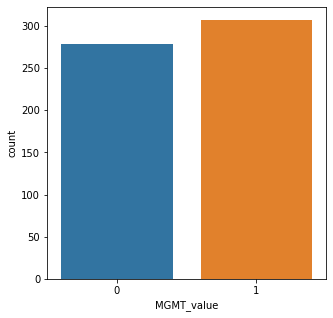

In [3]:
plt.figure(figsize=(5, 5))
sns.countplot(data=train_df, x="MGMT_value");

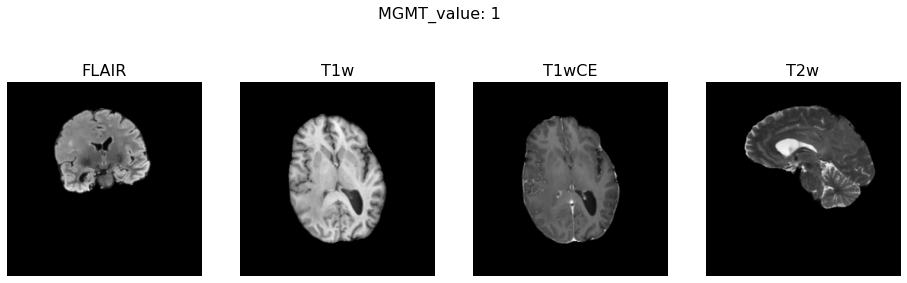

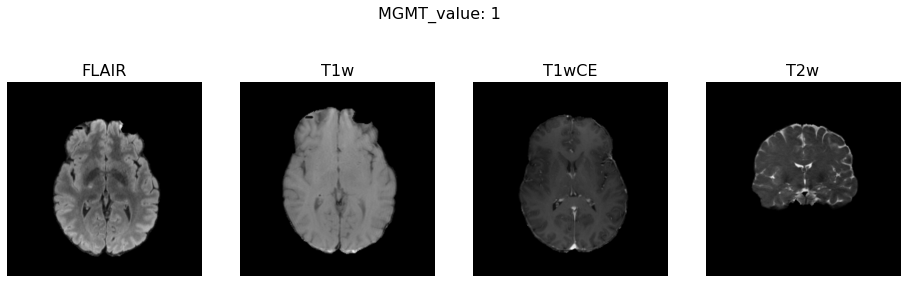

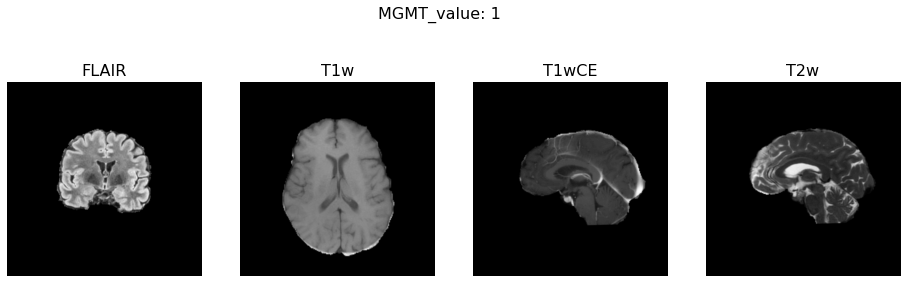

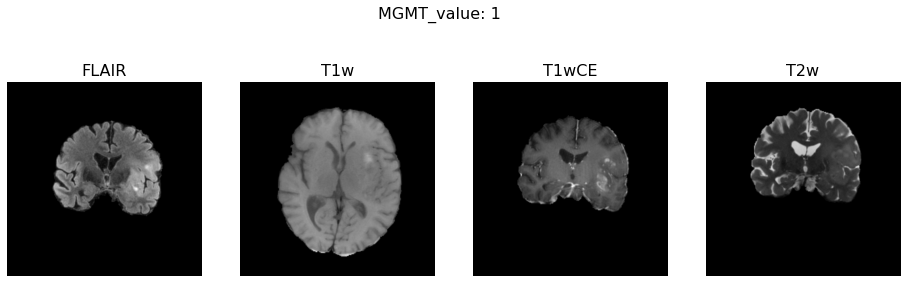

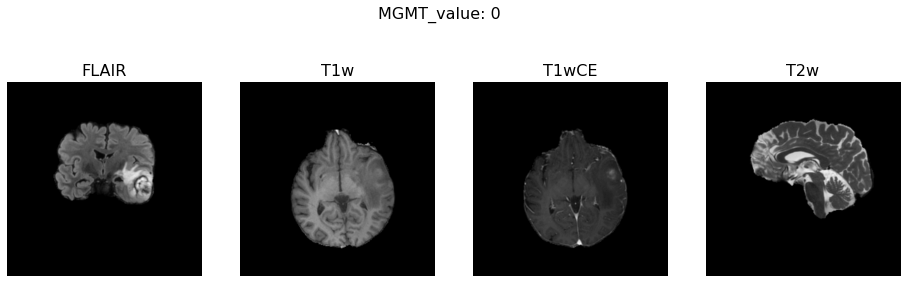

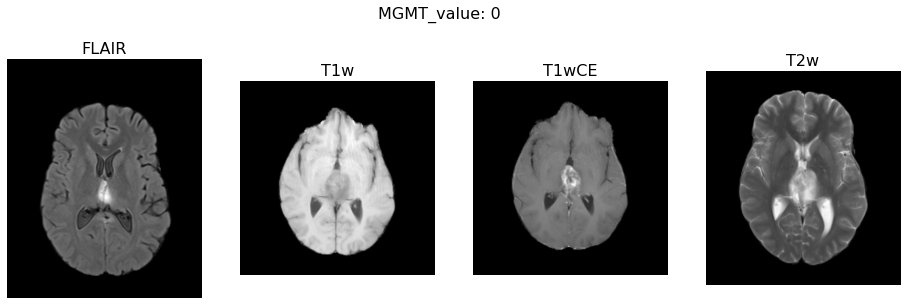

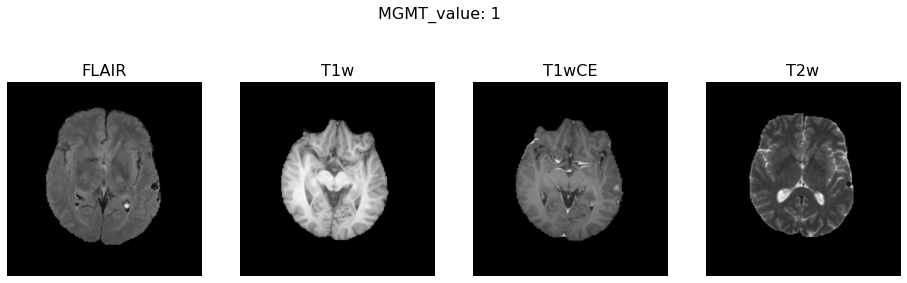

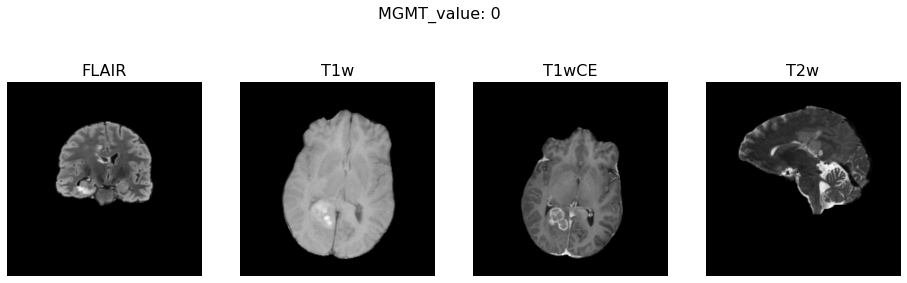

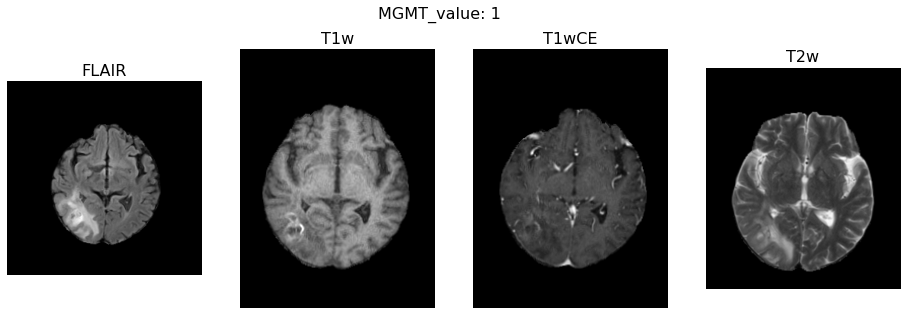

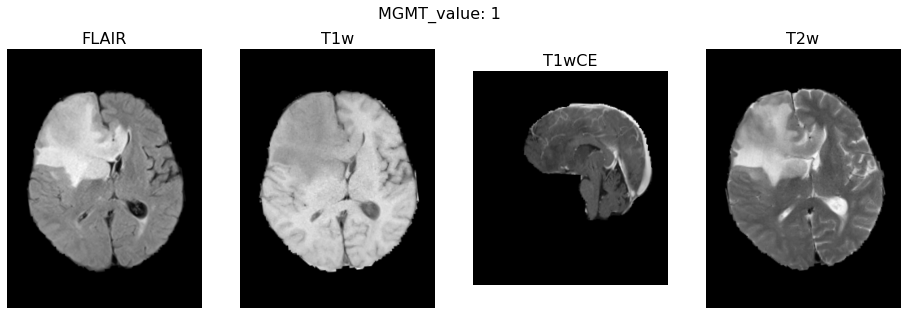

In [5]:
for i in random.sample(range(train_df.shape[0]), 10):
    _brats21id = train_df.iloc[i]["BraTS21ID"]
    _mgmt_value = train_df.iloc[i]["MGMT_value"]
    visualize_sample(brats21id=_brats21id, mgmt_value=_mgmt_value, slice_i=0.5)
    

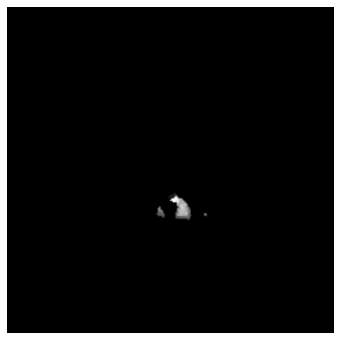

In [8]:
images = load_dicom_line("../input/rsna-miccai-brain-tumor-radiogenomic-classification/train/00000/T1w")
create_animation(images)

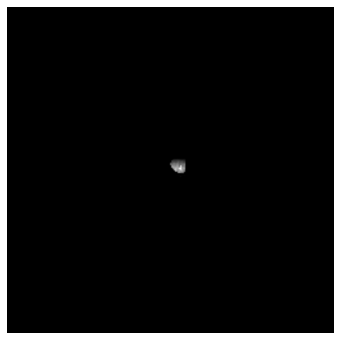

In [9]:
images = load_dicom_line("../input/rsna-miccai-brain-tumor-radiogenomic-classification/train/00000/T1wCE")
create_animation(images)

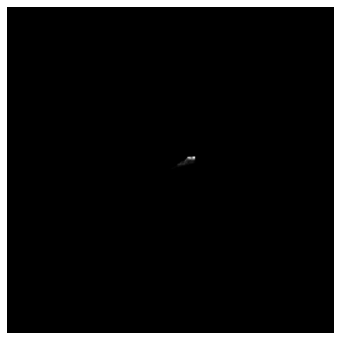

In [10]:
images = load_dicom_line("../input/rsna-miccai-brain-tumor-radiogenomic-classification/train/00000/T2w")
create_animation(images)

<a id="60"></a>
<h2 style='background:darkviolet; border:0; color:white'><center>Create Training,Validation and Test Splits <center><h2>

In [11]:
from sklearn.model_selection import train_test_split
#1) Create training and validation splits

df = pd.read_csv("../input/rsna-miccai-brain-tumor-radiogenomic-classification/train_labels.csv")

X_train, X_test, y_train, y_test = sklearn.model_selection.train_test_split(
    df.drop(columns=["MGMT_value"]),  # Features (exclude the MGMT_value column)
    df["MGMT_value"],  # Target variable (MGMT_value)
    test_size=0.2,
    random_state=42,
    stratify=df["MGMT_value"],  # Ensure proper stratification
)

print(f'train: {X_train.shape[0]} scans, test: {X_test.shape[0]} scans')


train: 468 scans, test: 117 scans


<a id="95"></a>
<h2 style='background:darkviolet; border:0; color:white'><center>Modeling ML Models: Ridge, Decision Tree, KNN <center><h2>

An exploration of Non DL, ML models like logistic regression.
Work here was inspired by some great tutorials.

1. Logistic Regression model - https://towardsdatascience.com/logistic-regression-with-pytorch-3c8bbea594be

By setting a specific seed value, you ensure reproducibility. This means that the same random split will be generated each time you execute the code, which can be very useful for debugging and ensuring that your results are consistent across runs.

In the train_test_split() function, stratify is turned on to ensure that the proportion of MGMT values that are equal to 0 and 1 are the same in both the training and test split. train_df["MGMT_value"] is the stratification variable. 

**Be aware that we are splitting the training dataset into the model's actual training dataset and the model's validation dataset, which makes us 80% and 20% respectively.**

**Training Process**
Here, we trained 3 models in a single function. The function looks deceptively simple. But it is important to be able to understand what's happening behind the hood.

The train_ensemble function prints the 

1.AUC Score for each Classifier type 

2.cross-entropy loss using the function log_loss(y_test, preds)

In [3]:
#Helper Functions
from sklearn.linear_model import LogisticRegression, RidgeClassifier
from sklearn.neighbors import KNeighborsClassifier
from sklearn.tree import DecisionTreeClassifier
from sklearn.metrics import roc_auc_score, log_loss

models = [
    RidgeClassifier(),
    DecisionTreeClassifier(),
    KNeighborsClassifier(n_neighbors=60),
]

def train_ensemble(models:list, data:tuple, print_individual:bool=False):
    X_train, X_test, y_train, y_test = data
    full_preds = []
    for clf in models:
        clf.fit(X_train, y_train)
        try:
            preds = clf.predict_proba(X_test)[:, 1]
        except AttributeError:
            preds = clf.predict(X_test)
        full_preds.append(preds)
        if print_individual:
            print(
                clf.__class__.__name__.ljust(25), '  scores:',
                roc_auc_score(y_test, preds), 'ROC AUC; ',
                log_loss(y_test, preds), 'loss.'
            )
        print(full_preds)
    return full_preds

ensemble_predictions = train_ensemble(models, (X_train, X_test, y_train, y_test), True)
print('average:'.rjust(35), roc_auc_score(y_test, np.mean(ensemble_predictions, 0)), 'ROC AUC')

RidgeClassifier             scores: 0.484923887587822 ROC AUC;  17.41728367512161 loss.
[array([1, 1, 1, 0, 0, 1, 0, 1, 1, 1, 0, 0, 1, 1, 0, 1, 1, 1, 1, 0, 1, 0,
       0, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 0, 1, 1, 1, 1, 1,
       0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 0, 1, 1, 1, 1, 1,
       1, 0, 1, 1, 0, 0, 1, 0, 1, 1, 1, 1, 0, 0, 1, 1, 0, 1, 1, 1, 1, 0,
       1, 1, 0, 1, 0, 1, 1, 1, 0, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 0, 1, 1,
       1, 0, 1, 1, 1, 1, 1])]
DecisionTreeClassifier      scores: 0.5368852459016393 ROC AUC;  15.941165077377967 loss.
[array([1, 1, 1, 0, 0, 1, 0, 1, 1, 1, 0, 0, 1, 1, 0, 1, 1, 1, 1, 0, 1, 0,
       0, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 0, 1, 1, 1, 1, 1,
       0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 0, 1, 1, 1, 1, 1,
       1, 0, 1, 1, 0, 0, 1, 0, 1, 1, 1, 1, 0, 0, 1, 1, 0, 1, 1, 1, 1, 0,
       1, 1, 0, 1, 0, 1, 1, 1, 0, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 0, 1, 1,
       1, 0, 1, 1, 1, 1, 1]), array([0., 0., 0., 1., 0., 0.,

<a id="95"></a>
<h2 style='background:darkviolet; border:0; color:white'><center>Modeling ML Models: Linear Model <center><h2>

In [8]:
#Helper Functions
import torch
import torch.nn as nn
import torch.optim as optim
import numpy as np
import wandb
from sklearn.metrics import roc_auc_score, log_loss
from sklearn.model_selection import train_test_split
from torch.utils.data import DataLoader, TensorDataset
from sklearn.metrics import confusion_matrix, classification_report, roc_auc_score, accuracy_score, precision_score, recall_score, f1_score
import os
import cv2
import glob
import torch
import numpy as np
import torch.utils.data as torch_data

def set_seed(seed):
    random.seed(seed)
    os.environ["PYTHONHASHSEED"] = str(seed)
    np.random.seed(seed)
    torch.manual_seed(seed)
    if torch.cuda.is_available():
        torch.cuda.manual_seed_all(seed)
        torch.backends.cudnn.deterministic = True

# Define a simple binary classification model using PyTorch
class ClassifierModel(nn.Module):
    def __init__(self, input_dim):
        super(ClassifierModel, self).__init__()
        self.fc1 = nn.Linear(input_dim, 64)
        self.fc2 = nn.Linear(64, 1)
        self.sigmoid = nn.Sigmoid()

    def forward(self, x):
        x = torch.relu(self.fc1(x))
        x = self.fc2(x)
        x = self.sigmoid(x)
        return x

def train_model(model, train_loader, optimizer, criterion):
    model.train()
    running_loss = 0.0

    for inputs, labels in train_loader:
        optimizer.zero_grad()
        outputs = model(inputs)
        loss = criterion(outputs, labels)
        loss.backward()
        optimizer.step()
        running_loss += loss.item()

    return running_loss / len(train_loader)

def evaluate_model(model, data_loader, criterion):
    model.eval()
    running_loss = 0.0
    all_preds = []
    all_labels = []

    with torch.no_grad():
        for inputs, labels in data_loader:
            outputs = model(inputs)
            loss = criterion(outputs, labels)
            running_loss += loss.item()
            all_preds.extend(outputs.cpu().numpy())
            all_labels.extend(labels.cpu().numpy())

    return running_loss / len(data_loader), np.array(all_preds), np.array(all_labels)

In [9]:
 #use for test dataset only
class DataRetriever(torch_data.Dataset):
    def __init__(self, paths):
        self.paths = paths
          
    def __len__(self):
        return len(self.paths)
    
    def __getitem__(self, index):
        _id = self.paths[index]
        patient_path = f"../input/rsna-miccai-brain-tumor-radiogenomic-classification/test/{str(_id).zfill(5)}/"
        channels = []
        for t in ("FLAIR", "T1w", "T1wCE"): # "T2w"
            t_paths = sorted(
                glob.glob(os.path.join(patient_path, t, "*")), 
                key=lambda x: int(x[:-4].split("-")[-1]),
            )
            # start, end = int(len(t_paths) * 0.475), int(len(t_paths) * 0.525)
            x = len(t_paths)
            if x < 10:
                r = range(x)
            else:
                d = x // 10
                r = range(d, x - d, d)
                
            channel = []
            # for i in range(start, end + 1):
            for i in r:
                channel.append(cv2.resize(load_dicom(t_paths[i]), (256, 256)) / 255)
            channel = np.mean(channel, axis=0)
            channels.append(channel)
        
        return {"X": torch.tensor(channels).float(), "id": _id}

In [13]:
# Assuming you have your data in pandas DataFrames (X_train, y_train, X_test, y_test)
# Convert them to PyTorch tensors with the correct shape
X_train_tensor = torch.FloatTensor(X_train.values)
y_train_tensor = torch.FloatTensor(y_train.values).view(-1, 1)  # Convert y_train to a 2D tensor

X_test_tensor = torch.FloatTensor(X_test.values)
y_test_tensor = torch.FloatTensor(y_test.values).view(-1, 1)    # Convert y_test to a 2D tensor


# Create DataLoader for training data
train_dataset = TensorDataset(X_train_tensor, y_train_tensor)
train_loader = DataLoader(train_dataset, batch_size=32, shuffle=True)

# Create DataLoader for validation data
val_dataset = TensorDataset(X_test_tensor, y_test_tensor)
val_loader = DataLoader(val_dataset, batch_size=32)

In [14]:
# W&B for experiment tracking
wandb.login()# d05aad2fdc941e97e932773d1c7143862d777bad

wandb: You can find your API key in your browser here: https://wandb.ai/authorize


wandb: Paste an API key from your profile and hit enter:  ········································


wandb: Appending key for api.wandb.ai to your netrc file: /root/.netrc


True

In [10]:
# Initialize wandb with your API key and project name
wandb.init(project="RSNA-miccai-brain-tumor-radiogenomic-classification")
# Define the models and optimizers
input_dim = X_train.shape[1]
models = [ClassifierModel(input_dim) for _ in range(3)]
optimizers = [optim.Adam(model.parameters()) for model in models] 
#Here we are actually training 3 instances of the same
#classifier, we get different loss and AUC score due to the stochasticity of ADAM
criterion = nn.BCELoss()  # Binary Cross-Entropy Loss
# Train the models and collect individual AUC scores and losses
individual_auc_scores = []
individual_losses = []

for model, optimizer in zip(models, optimizers):
    for epoch in range(10):  # Adjust the number of epochs as needed
        train_loss = train_model(model, train_loader, optimizer, criterion)
        
        # Log training loss and other metrics using Wandb
        wandb.log({"Train Loss": train_loss, "Epoch": epoch})
        
    validation_loss, preds, labels = evaluate_model(model, val_loader, criterion)
    auc_score = roc_auc_score(labels, preds)
    individual_auc_scores.append(auc_score)
    individual_losses.append(validation_loss)
    
    # Log validation loss and AUC score using Wandb
    wandb.log({"Validation Loss": validation_loss, "Validation AUC": auc_score})

    print(
        model.__class__.__name__.ljust(25),
        '  scores:', auc_score, 'ROC AUC; ',
        validation_loss, 'loss.'
    )

# Calculate the average AUC score
average_auc_score = np.mean(individual_auc_scores)
average_loss = np.mean(individual_losses)

print('average:'.rjust(35), average_auc_score, 'ROC AUC')

# Log the average AUC score using Wandb
wandb.log({"Average ROC AUC": average_auc_score})

wandb: Currently logged in as: shamussim (use `wandb login --relogin` to force relogin)
wandb: wandb version 0.15.9 is available!  To upgrade, please run:
wandb:  $ pip install wandb --upgrade


ClassifierModel             scores: 0.47658079625292743 ROC AUC;  0.7187845408916473 loss.
ClassifierModel             scores: 0.4651639344262295 ROC AUC;  0.6953965723514557 loss.
ClassifierModel             scores: 0.47658079625292743 ROC AUC;  0.740742102265358 loss.
                           average: 0.4727751756440281 ROC AUC


In [39]:
# Define the device (use GPU if available, otherwise use CPU)
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

# Define the model names (use the actual names of your classifiers)
model_names = ["Classifier1", "Classifier2", "Classifier3"]

# Initialize lists to store results
results = []

# Iterate through models
for model_idx, (model, model_name) in enumerate(zip(models, model_names)):
    y_pred = []
    ids = []

    for e, batch in enumerate(test_loader):
        print(f"Model {model_name}, Batch {e}/{len(test_loader)}", end="\r")
        with torch.no_grad():
            # Ensure the input data has the correct shape (batch_size, num_features)
            x = batch["X"].to(device)  # Assuming your input data key is "X"
            
            # Perform forward pass
            tmp_pred = torch.sigmoid(model(x)).cpu().numpy().squeeze()
            
        y_pred.extend(tmp_pred)
        ids.extend(batch["BraTS21ID"].numpy().tolist())  # Assuming "BraTS21ID" is the correct key for IDs

    # Create a submission DataFrame
    submission = pd.DataFrame({"BraTS21ID": ids, "MGMT_value": y_pred})
    results.append({"model_name": model_name, "submission": submission})

# Perform analysis on the results
for result in results:
    model_name = result["model_name"]
    submission = result["submission"]

    # Save the DataFrame to a CSV file for each model
    submission_filename = f"submission_{model_name}.csv"
    submission.to_csv(submission_filename, index=False)

    # Calculate and log classification metrics (AUC, Accuracy, Precision, Recall, F1)
    auc = roc_auc_score(y_test.values, submission["MGMT_value"])
    accuracy = accuracy_score(y_test.values, np.round(submission["MGMT_value"]))
    precision = precision_score(y_test.values, np.round(submission["MGMT_value"]))
    recall = recall_score(y_test.values, np.round(submission["MGMT_value"]))
    f1 = f1_score(y_test.values, np.round(submission["MGMT_value"]))

    wandb.log({f"AUC_{model_name}": auc})
    wandb.log({f"Accuracy_{model_name}": accuracy})
    wandb.log({f"Precision_{model_name}": precision})
    wandb.log({f"Recall_{model_name}": recall})
    wandb.log({f"F1_{model_name}": f1})

    # Calculate and log confusion matrix
    conf_mat = confusion_matrix(y_test.values, np.round(submission["MGMT_value"]))
    wandb.log({f"confusion_matrix_{model_name}": wandb.plot.confusion_matrix(probs=None,
                                                                             y_true=y_test.values,
                                                                             preds=np.round(submission["MGMT_value"]),
                                                                             class_names=["Class 0", "Class 1"])})

    # Generate and log a classification report
    report = classification_report(y_test.values, np.round(submission["MGMT_value"]),
                                   target_names=["Class 0", "Class 1"], output_dict=True)
    wandb.log({f"classification_report_{model_name}": report})


RuntimeError: mat1 and mat2 shapes cannot be multiplied (3072x256 and 1x64)

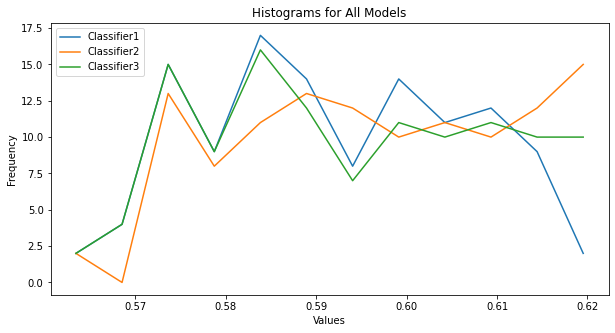

In [28]:
# Create a single plot for all histograms
plt.figure(figsize=(10, 5))
for model_name, histogram_data in zip(model_names, all_histogram_data):
    plt.plot(bin_edges[:-1], histogram_data, label=model_name)

plt.legend()
plt.title("Histograms for All Models")
plt.xlabel("Values")
plt.ylabel("Frequency")
plt.savefig("all_histograms.png")

# Close the WandB run when all models are done
wandb.finish()


In [38]:
#Load Test Dataset
test_data_retriever = DataRetriever(
    submission["BraTS21ID"].values, 
)

test_loader = torch_data.DataLoader(
    test_data_retriever,
    batch_size=4,
    shuffle=False,
    num_workers=8,
)

y_pred = []
ids = []

for e, batch in enumerate(test_loader):
    print(f"{e}/{len(test_loader)}", end="\r")
    with torch.no_grad():
        tmp_pred = np.zeros((batch["X"].shape[0], ))
        for model in models:
            tmp_res = torch.sigmoid(model(batch["X"].to(device))).cpu().numpy().squeeze()
            tmp_pred += tmp_res
        y_pred.extend(tmp_pred)
        ids.extend(batch["id"].numpy().tolist())

RuntimeError: mat1 and mat2 shapes cannot be multiplied (3072x256 and 1x64)

Plot Confusion Matrix. This helps us to analyse the errors generated by our classifier.

In [29]:
submission

,BraTS21ID,MGMT_value
0,[377.0],0.599491
1,[308.0],0.603874
2,[704.0],0.579916
3,[78.0],0.619003
4,[62.0],0.620058
...,...,...
112,[285.0],0.605376
113,[444.0],0.595358
114,[753.0],0.577138
115,[819.0],0.573478


In [25]:
submission

,BraTS21ID,MGMT_value
0,[0.0],0.599491
1,[0.0],0.603874
2,[1.0],0.579916
3,[1.0],0.619003
4,[1.0],0.620058
...,...,...
112,[1.0],0.605376
113,[0.0],0.595358
114,[0.0],0.577138
115,[1.0],0.573478


In [ ]:
class_names = ["0", "1"]  # Replace with your class names

wandb.log({"conf_mat": wandb.plot.confusion_matrix(probs=None,
                                                    y_true=ground_truth,
                                                    preds=y_pred,
                                                    class_names=class_names)})


<a id="100"></a>
<h2 style='background:darkviolet; border:0; color:white'><center>Modeling Efficient Net<center><h2>

In [15]:
#Helper Functions for Efficient Net
class Trainer:
    def __init__(
        self, 
        model, 
        device, 
        optimizer, 
        criterion, 
        loss_meter, 
        score_meter
    ):
        self.model = model
        self.device = device
        self.optimizer = optimizer
        self.criterion = criterion
        self.loss_meter = loss_meter
        self.score_meter = score_meter
        
        self.best_valid_score = -np.inf
        self.n_patience = 0
        
        self.messages = {
            "epoch": "[Epoch {}: {}] loss: {:.5f}, score: {:.5f}, time: {} s",
            "checkpoint": "The score improved from {:.5f} to {:.5f}. Save model to '{}'",
            "patience": "\nValid score didn't improve last {} epochs."
        }
    
    def fit(self, epochs, train_loader, valid_loader, save_path, patience):        
        for n_epoch in range(1, epochs + 1):
            self.info_message("EPOCH: {}", n_epoch)
            
            train_loss, train_score, train_time = self.train_epoch(train_loader)
            valid_loss, valid_score, valid_time = self.valid_epoch(valid_loader)
            
            self.info_message(
                self.messages["epoch"], "Train", n_epoch, train_loss, train_score, train_time
            )
            
            self.info_message(
                self.messages["epoch"], "Valid", n_epoch, valid_loss, valid_score, valid_time
            )

            if True:
#             if self.best_valid_score < valid_score:
                self.info_message(
                    self.messages["checkpoint"], self.best_valid_score, valid_score, save_path
                )
                self.best_valid_score = valid_score
                self.save_model(n_epoch, save_path)
                self.n_patience = 0
            else:
                self.n_patience += 1
            
            if self.n_patience >= patience:
                self.info_message(self.messages["patience"], patience)
                break
            
    def train_epoch(self, train_loader):
        self.model.train()
        t = time.time()
        train_loss = self.loss_meter()
        train_score = self.score_meter()
        
        for step, batch in enumerate(train_loader, 1):
            X = batch["X"].to(self.device)
            targets = batch["y"].to(self.device)
            self.optimizer.zero_grad()
            outputs = self.model(X).squeeze(1)
            
            loss = self.criterion(outputs, targets)
            loss.backward()

            train_loss.update(loss.detach().item())
            train_score.update(targets, outputs.detach())

            self.optimizer.step()
            
            _loss, _score = train_loss.avg, train_score.avg
            message = 'Train Step {}/{}, train_loss: {:.5f}, train_score: {:.5f}'
            self.info_message(message, step, len(train_loader), _loss, _score, end="\r")
        
        return train_loss.avg, train_score.avg, int(time.time() - t)
    
    def valid_epoch(self, valid_loader):
        self.model.eval()
        t = time.time()
        valid_loss = self.loss_meter()
        valid_score = self.score_meter()

        for step, batch in enumerate(valid_loader, 1):
            with torch.no_grad():
                X = batch["X"].to(self.device)
                targets = batch["y"].to(self.device)

                outputs = self.model(X).squeeze(1)
                loss = self.criterion(outputs, targets)

                valid_loss.update(loss.detach().item())
                valid_score.update(targets, outputs)
                
            _loss, _score = valid_loss.avg, valid_score.avg
            message = 'Valid Step {}/{}, valid_loss: {:.5f}, valid_score: {:.5f}'
            self.info_message(message, step, len(valid_loader), _loss, _score, end="\r")
        
        return valid_loss.avg, valid_score.avg, int(time.time() - t)
    
    def save_model(self, n_epoch, save_path):
        torch.save(
            {
                "model_state_dict": self.model.state_dict(),
                "optimizer_state_dict": self.optimizer.state_dict(),
                "best_valid_score": self.best_valid_score,
                "n_epoch": n_epoch,
            },
            save_path,
        )
    
    @staticmethod
    def info_message(message, *args, end="\n"):
        print(message.format(*args), end=end)

In [ ]:
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

train_data_retriever = DataRetriever(
    df_train["BraTS21ID"].values, 
    df_train["MGMT_value"].values, 
)

valid_data_retriever = DataRetriever(
    df_valid["BraTS21ID"].values, 
    df_valid["MGMT_value"].values,
)

train_loader = torch_data.
(
    train_data_retriever,
    batch_size=8,
    shuffle=True,
    num_workers=8,
)

valid_loader = torch_data.DataLoader(
    valid_data_retriever, 
    batch_size=8,
    shuffle=False,
    num_workers=8,
)

#specify which Class of ML models
#ie. model = LogisticRegression(input_dim,output_dim)
model = LogisticRegression(1,8)
model.to(device)

optimizer = torch.optim.Adam(model.parameters(), lr=0.001)
criterion = torch_functional.binary_cross_entropy_with_logits

trainer = Trainer(
    model, 
    device, 
    optimizer, 
    criterion, 
    LossMeter, 
    AccMeter
)

history = trainer.fit(
    10, 
    train_loader, 
    valid_loader, 
    f"best-model-0.pth", 
    100,
)


In [ ]:
models = []
for i in range(1):
    model = Model()
    model.to(device)
    
    checkpoint = torch.load(f"best-model-{i}.pth")
    model.load_state_dict(checkpoint["model_state_dict"])
    model.eval()
    
    models.append(model)

In [ ]:
submission = pd.read_csv("../input/rsna-miccai-brain-tumor-radiogenomic-classification/sample_submission.csv")

test_data_retriever = DataRetriever(
    submission["BraTS21ID"].values,split_type='test' 
)

test_loader = torch_data.DataLoader(
    test_data_retriever,
    batch_size=4,
    shuffle=False,
    num_workers=8,
)